<a href="https://colab.research.google.com/github/Bilal0Ali/restaurant_dataset/blob/main/restaurant_dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [50]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import folium
from folium.plugins import HeatMap

In [2]:
df = pd.read_csv('/content/Dataset .csv')

In [3]:
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


# Level 1


## Task 1
**Data Exploration and Preprocessing**

> Identify the number of rows and columns.

In [4]:
df.shape

(9551, 21)

> Checking for missing values in each column

In [5]:
df.isnull().sum()

,0
Restaurant ID,0
Restaurant Name,0
Country Code,0
City,0
Address,0
Locality,0
Locality Verbose,0
Longitude,0
Latitude,0
Cuisines,9


**Handing missing Values**
1. Imputation
2. Dropping

In [6]:
df['Cuisines'].value_counts()

,count
Cuisines,
North Indian,936
"North Indian, Chinese",511
Chinese,354
Fast Food,354
"North Indian, Mughlai",334
...,...
"World Cuisine, Patisserie, Cafe",1
"Burger, Izgara",1
"Desserts, B�_rek",1


In [36]:
# Since only 9 values were missing in a large dataset, dropping them won’t affect results.
df_cleaned = df.dropna(subset=['Cuisines'])

In [37]:
print(df_cleaned.shape)
df_cleaned.isnull().sum()

(9551, 21)


,0
Restaurant ID,0
Restaurant Name,0
Country Code,0
City,0
Address,0
Locality,0
Locality Verbose,0
Longitude,0
Latitude,0
Cuisines,0


In [38]:
df_cleaned['Switch to order menu'].value_counts()

,count
Switch to order menu,
No,9551


In [39]:
# since all values are same, we can drop this column.
# it is safe to drop a column that has the same value for all rows.
# because it provides no information to differentiate between data points and can even negatively impact our model.
df_cleaned = df_cleaned.drop('Switch to order menu', axis=1)

In [40]:
df_cleaned.shape

(9551, 20)

In [12]:
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9542 entries, 0 to 9550
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9542 non-null   int64  
 1   Restaurant Name       9542 non-null   object 
 2   Country Code          9542 non-null   int64  
 3   City                  9542 non-null   object 
 4   Address               9542 non-null   object 
 5   Locality              9542 non-null   object 
 6   Locality Verbose      9542 non-null   object 
 7   Longitude             9542 non-null   float64
 8   Latitude              9542 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9542 non-null   int64  
 11  Currency              9542 non-null   object 
 12  Has Table booking     9542 non-null   object 
 13  Has Online delivery   9542 non-null   object 
 14  Is delivering now     9542 non-null   object 
 15  Price range           9542

> Analysing the distribution of Aggregate Rating

<Axes: xlabel='Aggregate rating', ylabel='Count'>

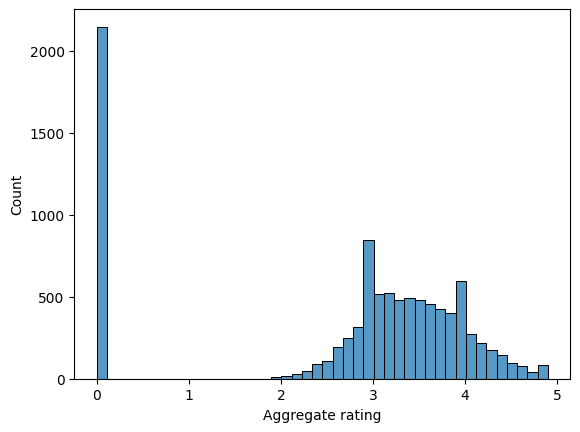

In [14]:
sns.histplot(df_cleaned['Aggregate rating'])

Here, the 0 rating doesnt necessarily means that the restraunt is bad, it could be not rated.

This class imbalance can be mitigated by imputing the 0 rating with the not rated.

In [19]:
df_cleaned['Aggregate rating'] = df_cleaned['Aggregate rating'].replace(0, np.nan)


<Axes: xlabel='Aggregate rating', ylabel='Count'>

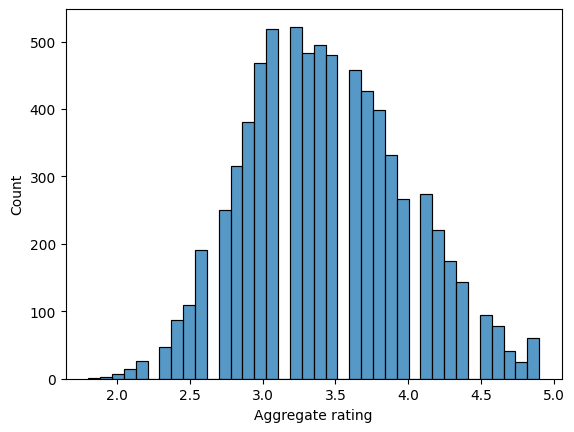

In [20]:
sns.histplot(df_cleaned['Aggregate rating'])

## Task 2
**Descriptive Analysis**

> Performing Statistical measures for numeric columns.

In [30]:
# mean of votes
df_cleaned['Votes'].mean()

np.float64(156.7720603647034)

In [25]:
# median of Average cost for two
df_cleaned['Average Cost for two'].median()

400.0

In [28]:
df_cleaned.describe(include='all')

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Price range,Aggregate rating,Rating color,Rating text,Votes
count,9.542000e+03,9542,9542.000000,9542,9542,9542,9542,9542.000000,9542.000000,9542,9542.000000,9542,9542,9542,9542,9542.000000,7394.000000,9542,9542,9542.000000
unique,NaN,7437,NaN,140,8910,1206,1263,NaN,NaN,1825,NaN,12,2,2,2,NaN,NaN,6,6,NaN
top,NaN,Cafe Coffee Day,NaN,New Delhi,"Sector 41, Noida",Connaught Place,"Connaught Place, New Delhi",NaN,NaN,North Indian,NaN,Indian Rupees(Rs.),No,No,No,NaN,NaN,Orange,Average,NaN
freq,NaN,83,NaN,5473,11,122,122,NaN,NaN,936,NaN,8652,8384,7091,9508,NaN,NaN,3734,3734,NaN
mean,9.043301e+06,NaN,18.179208,NaN,NaN,NaN,NaN,64.274997,25.848532,NaN,1200.326137,NaN,NaN,NaN,NaN,1.804968,3.439505,NaN,NaN,156.772060
std,8.791967e+06,NaN,56.451600,NaN,NaN,NaN,NaN,41.197602,11.010094,NaN,16128.743876,NaN,NaN,NaN,NaN,0.905563,0.552129,NaN,NaN,430.203324
min,5.300000e+01,NaN,1.000000,NaN,NaN,NaN,NaN,-157.948486,-41.330428,NaN,0.000000,NaN,NaN,NaN,NaN,1.000000,1.800000,NaN,NaN,0.000000
25%,3.019312e+05,NaN,1.000000,NaN,NaN,NaN,NaN,77.081565,28.478658,NaN,250.000000,NaN,NaN,NaN,NaN,1.000000,3.000000,NaN,NaN,5.000000
50%,6.002726e+06,NaN,1.000000,NaN,NaN,NaN,NaN,77.192031,28.570444,NaN,400.000000,NaN,NaN,NaN,NaN,2.000000,3.400000,NaN,NaN,31.000000
75%,1.835260e+07,NaN,1.000000,NaN,NaN,NaN,NaN,77.282043,28.642711,NaN,700.000000,NaN,NaN,NaN,NaN,2.000000,3.800000,NaN,NaN,130.000000


In [29]:
df_cleaned.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.542000e+03,9542.000000,9542.000000,9542.000000,9542.000000,9542.000000,7394.000000,9542.000000
mean,9.043301e+06,18.179208,64.274997,25.848532,1200.326137,1.804968,3.439505,156.772060
std,8.791967e+06,56.451600,41.197602,11.010094,16128.743876,0.905563,0.552129,430.203324
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,1.800000,0.000000
25%,3.019312e+05,1.000000,77.081565,28.478658,250.000000,1.000000,3.000000,5.000000
50%,6.002726e+06,1.000000,77.192031,28.570444,400.000000,2.000000,3.400000,31.000000
75%,1.835260e+07,1.000000,77.282043,28.642711,700.000000,2.000000,3.800000,130.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


> Distribution of "Country Code", "City" and "Cuisines"

In [47]:
df_cleaned['Country Code'].value_counts()

,count
Country Code,
1,8652
216,434
215,80
30,60
189,60
214,60
148,40
208,34
14,24


In [46]:
df_cleaned['City'].value_counts()

,count
City,
New Delhi,5473
Gurgaon,1118
Noida,1080
Faridabad,251
Ghaziabad,25
...,...
Lakes Entrance,1
Mohali,1
Panchkula,1


In [45]:
df_cleaned['Cuisines'].value_counts()

,count
Cuisines,
North Indian,945
"North Indian, Chinese",511
Fast Food,354
Chinese,354
"North Indian, Mughlai",334
...,...
"World Cuisine, Patisserie, Cafe",1
"Burger, Izgara",1
"Desserts, B�_rek",1


The top Cuisine is *North Indian* and *New Delhi* has the highest number of restaurants.

## Task 3
**Geospatial Analysis**

> Visualize the locations of restaurants on a
map using latitude and longitude
information.

In [51]:
# Define the desired color order for the rating categories
rating_color_map = {
    'Dark Green': 'darkgreen',
    'Green': 'green',
    'Yellow': 'yellow',
    'Orange': 'orange',
    'Red': 'red',
    'White': 'white'
}

fig = px.scatter_mapbox(
    df,
    lat="Latitude",
    lon="Longitude",
    hover_name="Restaurant Name",
    hover_data=["City", "Aggregate rating"],
    color="Rating color",
    color_discrete_map=rating_color_map, # Use the defined color map
    zoom=2,
    height=700
)
fig.update_layout(mapbox_style="open-street-map")
fig.show()

In [52]:
m = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=2)

for _, row in df.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=4,
        color='blue',
        fill=True,
        fill_opacity=0.6,
        popup=f"{row['City']} ({row['Aggregate rating']})"
    ).add_to(m)

m.save("restaurants_map.html")

In [53]:
m

> Correlation between restaurant location and rating shown on a heatmap

In [54]:
n = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=3)
heat_data = [[row['Latitude'], row['Longitude'], row['Aggregate rating']] for index, row in df.iterrows()]
HeatMap(heat_data).add_to(n)
n.save("restaurant_heatmap.html")


In [55]:
n

> Analyze the distribution of restaurants
across different cities or countries.

/tmp/ipython-input-3954310848.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




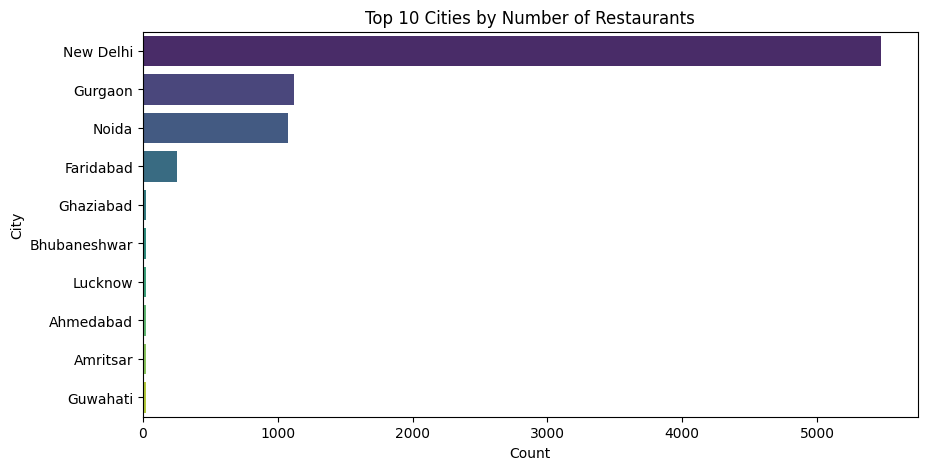

In [56]:
city_counts = df['City'].value_counts().head(10)

plt.figure(figsize=(10,5))
sns.barplot(x=city_counts.values, y=city_counts.index, palette='viridis')
plt.title('Top 10 Cities by Number of Restaurants')
plt.xlabel('Count')
plt.ylabel('City')
plt.show()

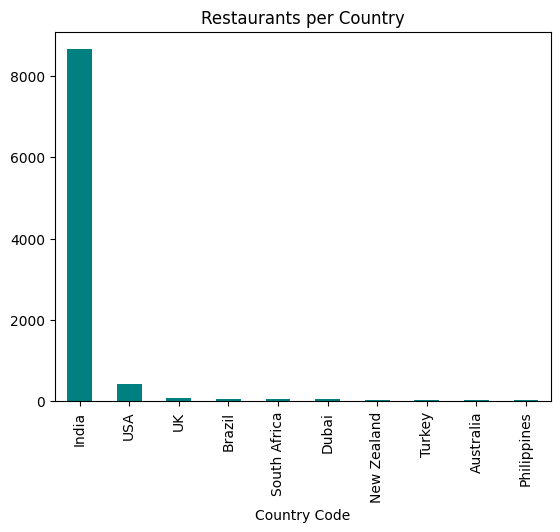

In [57]:
country_mapping = {
    1: 'India',
    216: 'USA',
    215: 'UK',
    30: 'Brazil',
    189: 'South Africa',
    214: 'Dubai',
    148: 'New Zealand',
    208: 'Turkey',
    14: 'Australia',
    162: 'Philippines'
}

df['Country Code'] = df['Country Code'].replace(country_mapping)

country_counts = df['Country Code'].value_counts().head(10)
country_counts.plot(kind='bar', color='teal', title='Restaurants per Country')
plt.show()

# Level 2

## Task 1
**Table Booking and Online Delivery**

> Determine the percentage of restaurants that
offer table booking and online delivery.

In [61]:
df_cleaned['Has Online delivery'].value_counts()

,count
Has Online delivery,
No,7100
Yes,2451


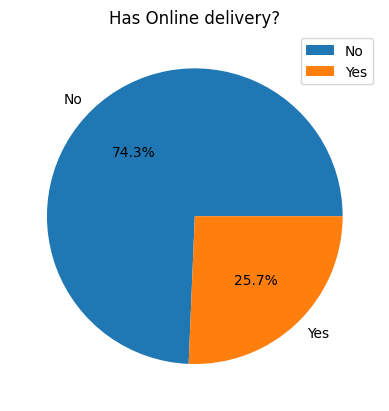

In [64]:
df_cleaned['Has Online delivery'].value_counts().plot(kind="pie", autopct='%1.1f%%')
plt.title("Has Online delivery?")
plt.ylabel("")
plt.legend()
plt.show()

In [62]:
df_cleaned['Has Table booking'].value_counts()

,count
Has Table booking,
No,8393
Yes,1158


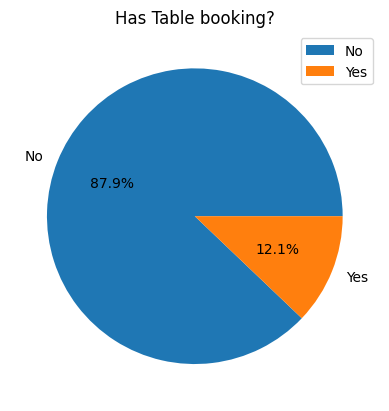

In [65]:
df['Has Table booking'].value_counts().plot(kind="pie", autopct='%1.1f%%')
plt.title("Has Table booking?")
plt.ylabel("")
plt.legend()
plt.show()

> Compare the average ratings of restaurants
with table booking and those without.

In [69]:
avg_rating = df_cleaned.groupby('Has Table booking')['Aggregate rating'].mean()
display(avg_rating)

,Aggregate rating
Has Table booking,
No,2.559359
Yes,3.441969


Restaurants offering table booking have higher average ratings.

> Analyze the availability of online delivery
among restaurants with different price ranges.

In [74]:
del_by_price = df_cleaned.groupby('Price range')['Has Online delivery'].value_counts().unstack()
display(del_by_price)

Has Online delivery,No,Yes
Price range,,
1,3743,701
2,1827,1286
3,997,411
4,533,53


## Task 2
**Price Range Analysis**

> Determine the most common price range
among all the restaurants.

In [75]:
df_cleaned['Price range'].value_counts()

,count
Price range,
1,4444
2,3113
3,1408
4,586


*The most common price range among all the restaurants is 1.*

>  Calculate the average rating for each price
range.

In [78]:
avg_rating_by_price = df_cleaned.groupby('Price range')['Aggregate rating'].mean()
display(avg_rating_by_price)

,Aggregate rating
Price range,
1,1.999887
2,2.941054
3,3.683381
4,3.817918


*So, higher the price range, higher the average rating.*

> Identify the color that represents the highest
average rating among different price ranges.

In [82]:
color_avg_rating = df_cleaned.groupby('Rating color')['Aggregate rating'].mean()
display(color_avg_rating)

,Aggregate rating
Rating color,
Dark Green,4.659801
Green,4.168119
Orange,3.051619
Red,2.297849
White,0.000000
Yellow,3.683429


*The rating color representing the highest average rating is 'Dark Green' with an average rating of 4.66.*

In [84]:
# Group by Price range and Rating color and calculate the mean of Aggregate rating
avg_rating_by_price_and_color = df_cleaned.groupby(['Price range', 'Rating color'])['Aggregate rating'].mean().unstack()
display(avg_rating_by_price_and_color)

Rating color,Dark Green,Green,Orange,Red,White,Yellow
Price range,,,,,,
1,4.668750,4.157639,3.040464,2.293548,0.0,3.661842
2,4.627536,4.159385,3.048491,2.300000,0.0,3.671159
3,4.646032,4.169231,3.097764,2.305000,0.0,3.716265
4,4.709459,4.188144,3.162376,2.283333,0.0,3.716000


## Task 3
**Feature Engineering**

>  Extract additional features from the existing
columns, such as the length of the restaurant
name or address.

In [85]:
# cost per person
df_cleaned['Cost per person'] = df_cleaned['Average Cost for two'] / 2

In [101]:
df_cleaned['Restaurant Name Length'] = df_cleaned['Restaurant Name'].str.len()
df_cleaned['Address Length'] = df_cleaned['Address'].str.len()

> Create new features like "Has Table Booking"
or "Has Online Delivery" by encoding
categorical variables.

In [108]:
# has both table and online delivery then encoded 1, otherwise 0
df_cleaned['Has Table and Online'] = (
    (df_cleaned['Has Table booking'] == 'Yes') & (df_cleaned['Has Online delivery'] == 'Yes')
).astype(int)

In [109]:
df_cleaned.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Is delivering now,Price range,Aggregate rating,Rating color,Rating text,Votes,Cost per person,Restaurant Name Length,Address Length,Has Table and Online
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,No,3,4.8,Dark Green,Excellent,314,550.0,16,71,0
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,No,3,4.5,Dark Green,Excellent,591,600.0,16,67,0
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,No,4,4.4,Green,Very Good,270,2000.0,22,56,0
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,No,4,4.9,Dark Green,Excellent,365,750.0,4,70,0
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,No,4,4.8,Dark Green,Excellent,229,750.0,11,64,0


In [107]:
df_cleaned['Has Table and Online'].value_counts()

,count
Has Table and Online,
0,9116
1,435


*So, 435 restaurants have both Online delivery and Table booking.*